<a href="https://colab.research.google.com/github/tuanlamdao/datascience/blob/master/7_Evaluating_Regressors.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Baseline Regressor
it could be model to predict the mean or median or even an arbitrary value based on domain knowledge of the problems.
percentile ( 25%, 50%, 75% and 100%) is a concept using in evaluation regressors

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd 'drive/My Drive/Colab Notebooks'

/content/drive/My Drive/Colab Notebooks


In [ ]:
from tuanlam import *

In [ ]:
diabetes = datasets.load_diabetes()
tts = skms.train_test_split(diabetes.data,diabetes.target,test_size=.25,random_state=42)
(diabetes_train_ftrs,diabetes_test_ftrs,
 diabetes_train_tgt,diabetes_test_tgt) = tts

In [ ]:
eval_results = []
baseline = dummy.DummyRegressor(strategy='median')
baseline.fit(diabetes_train_ftrs,diabetes_train_tgt)
base_preds = baseline.predict(diabetes_test_ftrs)
mse_median = metrics.mean_squared_error(base_preds, diabetes_test_tgt)
eval_results.append(mse_median)
print(eval_results)
baseline = dummy.DummyRegressor(strategy='constant')
baseline.fit(diabetes_train_ftrs,diabetes_train_tgt)
base_preds = baseline.predict(diabetes_test_ftrs)
mse_constant = metrics.mean_squared_error(base_preds, diabetes_test_tgt)
eval_results.append(mse_constant)
print(eval_results)
'''
strategies = ['constant','quantile'] ##,'mean','median'
baseline_args = [{"strategy":s} for s in strategies]
# additional arguments for constant and quantile
baseline_args[0]['constant'] = 50
baseline_args[1]['quantile'] = 0.75
# process a single argument package (a dictionary)
print(baseline_args)


def do_one(**args):
    baseline = dummy.DummyRegressor(**args)
    baseline.fit(diabetes_train_ftrs,diabetes_train_tgt)
    base_preds = baseline.predict(diabetes_test_ftrs)
    return metrics.mean_squared_error(base_preds, diabetes_test_tgt)
# Gather all results via a list comprehension
mses = [do_one(**bla) for bla in baseline_args]'''
#display(pd.DataFrame({'mse':mses}, index=strategies))

[5542.225225225226]


TypeError: ignored

##### Additional measure for regression
RMSE = Root Mean Squared Error

In [ ]:
def rms_error(actual, predicted):
    'Root mean squared error function'
    # lesser values are better (a<b means a is better)
    mse = metrics.mean_squared_error(actual, predicted)
    return np.sqrt(mse)

def neg_rmse_score(actual, predicted):
    'rmse based score function'
    # greater value are better (a<b means b is better)
    return -rms_error(actual, predicted)

def neg_rmse_scorer(mod,ftrs,tgt_actual):
    'rmse scorer suitable for scoring arg'
    tgt_pred = mod.predict(ftrs)
    return neg_rmse_score(tgt_actual,tgt_pred)

knn = neighbors.KNeighborsRegressor(n_neighbors=3)
skms.cross_val_score(knn,diabetes.data,diabetes.target,cv=skms.KFold(5,shuffle=True),scoring=neg_rmse_scorer)


array([-58.0034, -64.9886, -63.1431, -61.8124, -57.6243])

##### Other built-in Regression Metrics
R2 ( read - R squared) which is a defaul metric for all regressors.
some other metrics also used in regressors are mean absolute error, mean squared error, and median absolute error
R2 = 1 - (SSE_our_model / SSE_mean) where SSE_mean is our baseline regressor

In [ ]:
# Compute r2 score from actuals and test set predictions from a simple predict the mean model
baseline = dummy.DummyRegressor(strategy='mean')
baseline.fit(diabetes_train_ftrs, diabetes_train_tgt)
base_preds = baseline.predict(diabetes_test_ftrs)
# r2 is not symetric because true value have priority and are used to compute target mean
base_r2_sklearn = metrics.r2_score(diabetes_test_tgt, base_preds)
print(base_r2_sklearn)

-0.014016723490579253


In [ ]:
# sklearn -train-mean to predict test tgts
base_errors = base_preds - diabetes_test_tgt
sse_base_preds = np.dot(base_errors,base_errors)
#train-mean to predict test tgts
train_mean_errors = np.mean(diabetes_train_tgt) - diabetes_test_tgt
sse_mean_train = np.dot(train_mean_errors, train_mean_errors)
# test-mean to predict test tgts
test_mean_errors = np.mean(diabetes_test_tgt) - diabetes_test_tgt
sse_mean_test = np.dot(test_mean_errors,test_mean_errors)
print("sklearn train-mean model SSE (on test):", sse_base_preds)
print("manual train-mean model SSE (on test):", sse_mean_train)
print("manual test-mean model SSE (on test):", sse_mean_test)

sklearn train-mean model SSE (on test): 622398.970317905
manual train-mean model SSE (on test): 622398.970317905
manual test-mean model SSE (on test): 613795.5675675675


In [ ]:
1 - (sse_base_preds/sse_mean_test)

With R2 in sklearn, we are comparing my_model.fit(train) with mean_model.fit(test) and evaluate them against test.

In [ ]:
def get_model_name(model):
    'return name of model (class) as a string'
    return str(model.__class__).split('.')[-1][:-2]
    
testbase = dummy.DummyRegressor(strategy='mean')
testbase.fit(diabetes_test_ftrs,diabetes_test_tgt)
testbase_preds =  testbase.predict(diabetes_test_ftrs)
testbase_mse = metrics.mean_squared_error(testbase_preds,diabetes_test_tgt)

models = [neighbors.KNeighborsRegressor(n_neighbors=3), linear_model.LinearRegression()]
results = co.defaultdict(dict)
for m in models:
    preds = (m.fit(diabetes_train_ftrs, diabetes_train_tgt).predict(diabetes_test_ftrs))
    mse = metrics.mean_squared_error(preds,diabetes_test_tgt)
    r2 = metrics.r2_score(diabetes_test_tgt,preds)
    results[get_model_name(m)]['R^2'] = r2
    results[get_model_name(m)]['MSE'] = mse
print(testbase_mse)    
df = pd.DataFrame(results).T
df['Norm_MSE'] = df['MSE'] / testbase_mse
df['1-R^2'] = 1 - df['R^2']
display(df)

5529.689797906013


NameError: ignored

,R^2,MSE,Norm_MSE,1-R^2
KNeighborsRegressor,0.3722,"3,471.4194",0.6278,0.6278
LinearRegression,0.4849,"2,848.2953",0.5151,0.5151


so 1 - R2 computed by sklearn is the same to MSE of our model normalized by the fit-to-the-test-sample mean model. with that, instead of R2 we will simply use MSE or RMSE 

##### Error plots

In [ ]:
ape_df = pd.DataFrame({'predicted':[4,2,9],
                       'actual'   :[3,5,7]})
ape_df['error'] = ape_df['predicted'] - ape_df['actual']
ape_df.index.name = 'example'
##display(ape_df)

In [ ]:
def regression_errors(figsize,predicted,actual,errors='all'):
    ''' figsize -> subplots:
        predicted/actual data -> columns in a DataFrame
        errors -> "all" or sequence of indices '''
    fig, axes = plt.subplots(1,2,figsize=figsize,sharex=True,sharey=True)
    df = pd.DataFrame({'actual':actual,'predicted':predicted})
    for ax, (x,y) in zip(axes, it.permutations(['actual','predicted'])):
        #plot the data as '.': perfect as y=x line
        ax.plot(df[x],df[y],'.',label='data')
        ax.plot(df['actual'],df['actual'],'-',label='perfection')
        ax.legend()
        ax.set_xlabel('{} value'.format(x.capitalize()))
        ax.set_ylabel('{} value'.format(y.capitalize()))
        ax.set_aspect('equal')
    axes[1].yaxis.tick_right()
    axes[1].yaxis.set_label_position('right')
    # show connecting bars from data to perfect
    # for all or only those specified?
    if errors == 'all':
        errors = range(len(df))
    if errors:
        acts = df.actual.iloc[errors]
        preds = df.predicted.iloc[errors]
        axes[0].vlines(acts, preds, acts, 'r')
        axes[1].hlines(acts, preds, acts, 'r')
        
    

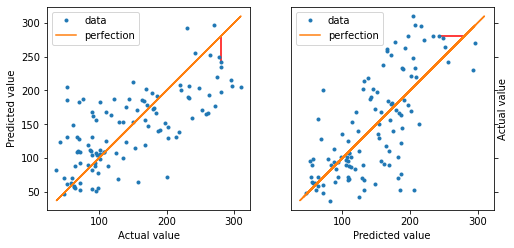

In [ ]:
lr = linear_model.LinearRegression()
preds = (lr.fit(diabetes_train_ftrs, diabetes_train_tgt).predict(diabetes_test_ftrs))
regression_errors((8,4),preds,diabetes_test_tgt,errors=[-20])

##### Residuals Plots
Residual = actual - predicted , it is an opposite of error = predicted - actual.
We can compare 2 different learners based on their residual plots

RecursionError: ignored

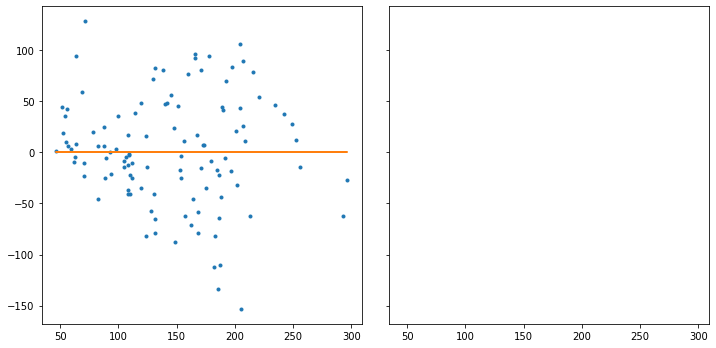

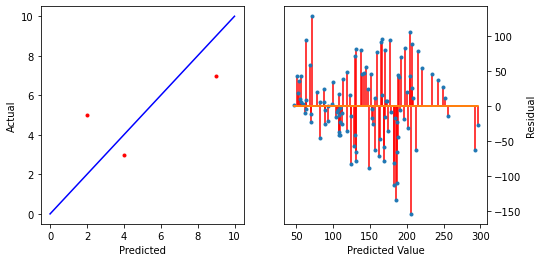

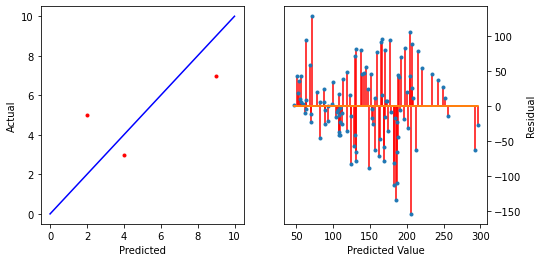

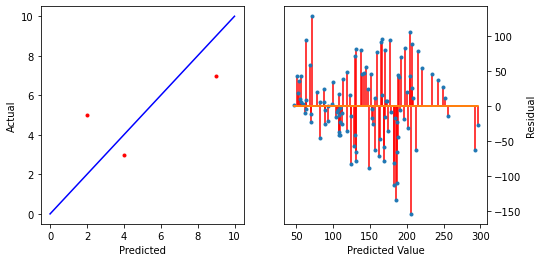

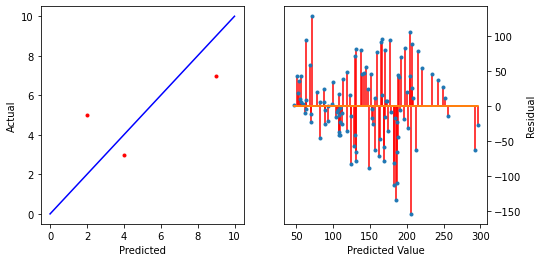

...

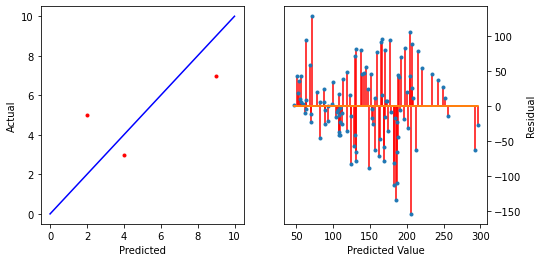

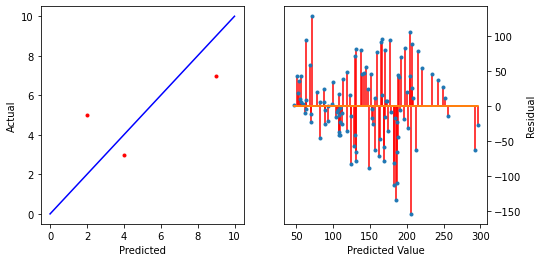

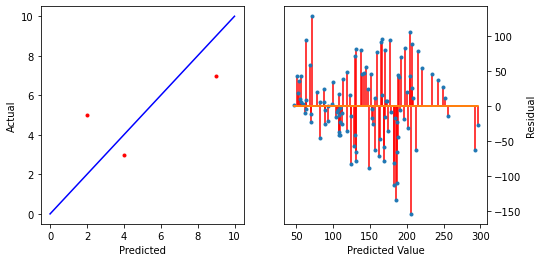

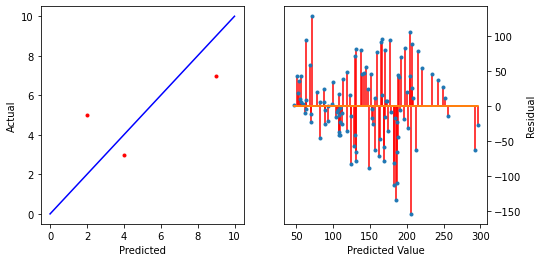

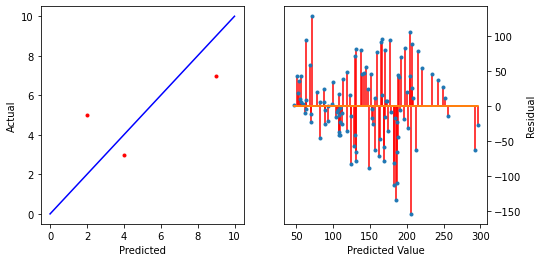

<Figure size 576x288 with 0 Axes>

In [27]:
def regression_residuals(ax,predicted,actual,show_errors=None,right=False):
    ''' figsize -> subplots: predicted/actual data -> columns of a dataframe'''
    df = pd.DataFrame({'actual':actual,'predicted':predicted})
    df['error'] = df.actual - df.predicted
    ax.plot(df.predicted, df.error,'.')
    ax.plot(df.predicted, np.zeros_like(predicted),'-')
    
    if right:
        ax.yaxis.tick_right()
        ax.yaxis.set_label_position("right")
        ax.set_xlabel('Predicted Value')
        ax.set_ylabel('Residual')
        
        if show_errors == 'all':
            show_errors = range(len(df))
        if show_errors:
            preds = df.predicted.iloc[show_errors]
            errors = df.error.iloc[show_errors]
            ax.vlines(preds,0,errors,'r')
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(8,4))
    ax1.plot(ape_df.predicted ,ape_df.actual,'r.',[0,10],[0,10],'b-')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('Actual')
    regression_residuals(ax2, df.predicted, df.actual, 'all',right = True)
    
        
        
lr = linear_model.LinearRegression()
knn = neighbors.KNeighborsRegressor()
models = [lr,knn]
fig, axes = plt.subplots(1,2,figsize=(10,5),sharex=True, sharey=True)
fig.tight_layout()
for model,ax in zip(models,axes):
    preds=(model.fit(diabetes_train_ftrs,diabetes_train_tgt).predict(diabetes_test_ftrs))
    regression_residuals(ax,preds,diabetes_test_tgt)
axes[0].set_title('Linear Regression Residuals')
axes[1].set_title('k-NN Regressor Residuals')



##### A first look at Standardization
 it is a 2 steps process: (1) adjust center of data and (2) adjust scale of data so it has a standard deviation of 1:
 1. substracting the mean 
 2. deviding byt the standard deviation

In [ ]:
xs = np.linspace(-5,10,20)
ys = 3*xs + 2 + np.random.uniform(20,40,20)
df = pd.DataFrame({'x':xs,'y':ys})
df_std_ized = (df - df.mean()) / df.std()
display(df_std_ized.describe().loc[['mean','std']])
(train_xs, test_xs, train_ys, test_ys) = skms.train_test_split(xs.reshape(-1,1),ys.reshape(-1,1),test_size=.5)
scaler = skpre.StandardScaler()
lr = skms.LinearRegression()
std_lr_pipe = pipeline.make_pipeline(scaler,lr)
std_lr_pipe.fit(train_xs, train_ys).predict(test_xs)


In [ ]:
student_url = ('http://archive.ics.uci.edu/'+'ml/machine-learning-databases/00320/student.zip')
def grab_student_numeric():
    import urllib.request, zipfile
    urllib.request.urlretrieve(student_url,'port_student.zip')
    zipfile.ZipFile('port_student.zip').extract('student-mat.csv')
    df = pd.read_csv('student-mat.csv',sep=';')
    df = df.drop(columns=['G1','G2']).select_dtypes(include=['number'])
    df.to_csv('portugese_student_numeric.csv',index=False)
st_file = grab_student_numeric()

In [ ]:
student_df = pd.read_csv('portugese_student_numeric.csv')
display(student_df[['absences']].describe().T)

In [ ]:
student_ftrs = student_df[student_df.columns[:-1]]
student_tgt = student_df['G3']

##### Cross validated results on Multiple Metrics

In [ ]:
scaler = preprocessing.StandardScaler()

lr = linear_model.LinearRegression()
knn_3 = neighbors.KNeighborsRegressor(n_neighbors=3)
knn_10 = neighbors.KNeighborsRegressor(n_neighbors=10)
std_lr_pipe = pipeline.make_pipeline(scaler,lr)
std_knn3_pipe = pipeline.make_pipeline(scaler,knn_3)
std_knn10_pipe = pipeline.make_pipeline(scaler,knn_10)

regressors = {'baseline': dummy.DummyRegressor(strategy='mean'),
              'std_knn3': std_knn3_pipe,
              'std_knn10': std_knn10_pipe,
              'std_lr': std_lr_pipe }
msrs = {'MAE':  metrics.make_scorer(metrics.mean_absolute_error),
        'RMSE': metrics.make_scorer(metrics.mean_squared_error)}
fig, axes = plt.subplots(2,1,figsize=(6,4))
fig.tight_layout()
for mod_name, model in regressors.items():
    cv_results = model_selection.cross_validate(model,student_ftrs,student_tgt,scoring=msrs,cv=10)
    for ax,msr in zip(axes,msrs):
        msr_results = cv_results["test_" + msr]
        my_lbl = "{:12s} {:.3f} {:.2f}".format(mod_name,msr_results.mean(),msr_results.std())
        ax.plot(msr_results, 'o--',label=my_lbl)
        ax.set_title(msr)
        #ax.set_legend()
        
        


In [ ]:
fig, axes = plt.subplots(1,1,figsize=(6,3))
baseline_results = model_selection.cross_val_score(regressors['baseline'],student_ftrs,student_tgt,scoring=msrs['RMSE'],cv=10)
for mod_name, model in regressors.items():
    if mod_name.startswith("std_"):
        cv_results = model_selection.cross_val_score(model,student_ftrs,student_tgt,scoring=msrs['RMSE'],cv=10)
        my_lbl = "{:12s} {:.3f} {:.2f}".format(mod_name,cv_results.mean(),cv_results.std())
        ax.plot(cv_results / baseline_results,'o--',label=my_lbl)
        ax.set_title("RMSE(mode) / RMSE(baseline)\n$<1$ is better than baseline")
        ax.legend()

